In [160]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline

import statistics

plt.rcParams['figure.figsize'] = [20,10]

def parse_ndarray(s):
    return np.fromstring(s, sep=' ') if s else None

def running_avg(x):
    return np.cumsum(x) / np.arange(1, x.size + 1)

def running_timeavg(t,x):
    dt = t[1:] - t[:-1]
    return np.cumsum(x[:-1] * dt) / t[1:]

In [116]:
def orderrunlist(mylist):
    orderedlist = [mylist[0]]
    for i in range(11, 20):
        orderedlist.append(mylist[i])
    for i in range(1, 11):
        orderedlist.append(mylist[i])
    return orderedlist;

def printtuplelist(tuplelist):
    for t in tuplelist:
        print('{} {}'.format(t[0], t[1]))

In [119]:
# Analisi del numero di rilevazioni effettuate per verificare l'attendibilità dei risultati
        
sourcedata = list()
sinkdata = list()

for i in range(48):
    n = pd.read_csv('csvresults/n{}.csv'.format(i + 1))
    
    sodraw = list()
    tmp = n[(n['module'] == 'Network.source') & (n['name'] == 'created:last') & (n['type'] == 'scalar')]
    for t in tmp.itertuples():
        sodraw.append((t.run, t.value))
    sod = orderrunlist(sodraw)
    for s in sod:
        sourcedata.append(int(s[1]))
    
    sidraw = list()
    tmp = n[(n['module'] == 'Network.sink') & (n['name'] == 'lifeTime:vector') & (n['type'] == 'vector')]
    for t in tmp.itertuples():
        sidraw.append((t.run, len(t.vecvalue.split(' '))))
    sid = orderrunlist(sidraw)
    for s in sid:
        sinkdata.append(int(s[1]))

sn = 0
nsm = 0
ms = 0
for s in sourcedata:
    if s < 900:
        sn = sn + 1
    elif s < 1000:
        nsm = nsm + 1
    else:
        ms = ms + 1
print('=== Job generati ===')
print('numero di esperimenti : {}'.format(len(sourcedata)))
print('osservazioni >= 1000 : {} => {:%}'.format(ms, ms / len(sourcedata)))
print('900 <= osservazioni < 1000 : {} => {:%}'.format(nsm, nsm / len(sourcedata)))
print('osservazioni < 900 : {} => {:%}'.format(sn, sn / len(sourcedata)))

sn = 0
nsm = 0
ms = 0
for s in sinkdata:
    if s < 900:
        sn = sn + 1
    elif s < 1000:
        nsm = nsm + 1
    else:
        ms = ms + 1
print('\n=== Job terminati ===')
print('numero di esperimenti : {}'.format(len(sourcedata)))
print('osservazioni >= 1000 : {} => {:%}'.format(ms, ms / len(sourcedata)))
print('900 <= osservazioni < 1000 : {} => {:%}'.format(nsm, nsm / len(sourcedata)))
print('osservazioni < 900 : {} => {:%}'.format(sn, sn / len(sourcedata)))

print('\n=== sourcedata ===')
print(sourcedata)

print('\n=== sinkdata ===')
print(sinkdata)

=== Job generati ===
numero di esperimenti : 960
osservazioni >= 1000 : 828 => 86.250000%
900 <= osservazioni < 1000 : 132 => 13.750000%
osservazioni < 900 : 0 => 0.000000%

=== Job terminati ===
numero di esperimenti : 960
osservazioni >= 1000 : 828 => 86.250000%
900 <= osservazioni < 1000 : 132 => 13.750000%
osservazioni < 900 : 0 => 0.000000%

=== sourcedata ===
[2002, 1950, 2013, 1981, 1940, 1961, 1955, 1979, 2016, 2003, 2036, 1988, 2107, 1971, 1934, 2001, 2004, 1997, 2071, 2050, 1968, 1970, 2014, 1966, 1949, 1970, 1923, 1966, 1951, 2030, 2026, 2026, 1983, 1982, 1973, 1938, 2033, 2063, 2025, 2011, 2003, 1958, 2010, 1982, 1941, 1955, 1972, 1984, 2022, 1988, 2027, 1981, 2110, 1956, 1937, 1984, 2009, 1997, 2051, 2051, 1970, 1970, 2014, 1964, 1948, 1970, 1923, 1966, 1951, 2021, 2026, 2026, 1983, 1982, 1973, 1938, 2033, 2063, 2025, 2011, 2030, 1943, 2004, 1978, 1943, 1973, 1955, 1982, 2024, 1988, 2009, 1995, 2079, 1956, 1931, 1995, 2008, 2009, 2057, 2050, 1968, 1970, 2017, 1963, 1949, 1

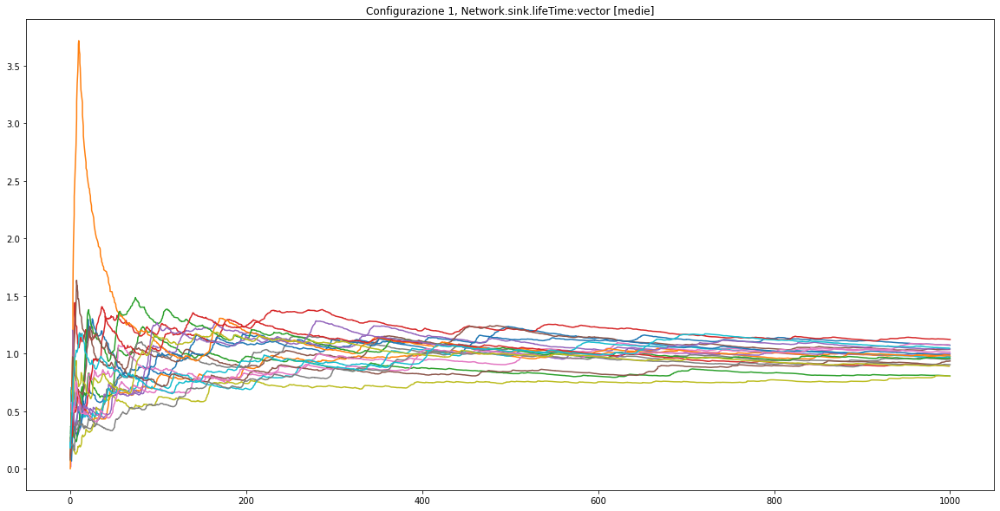

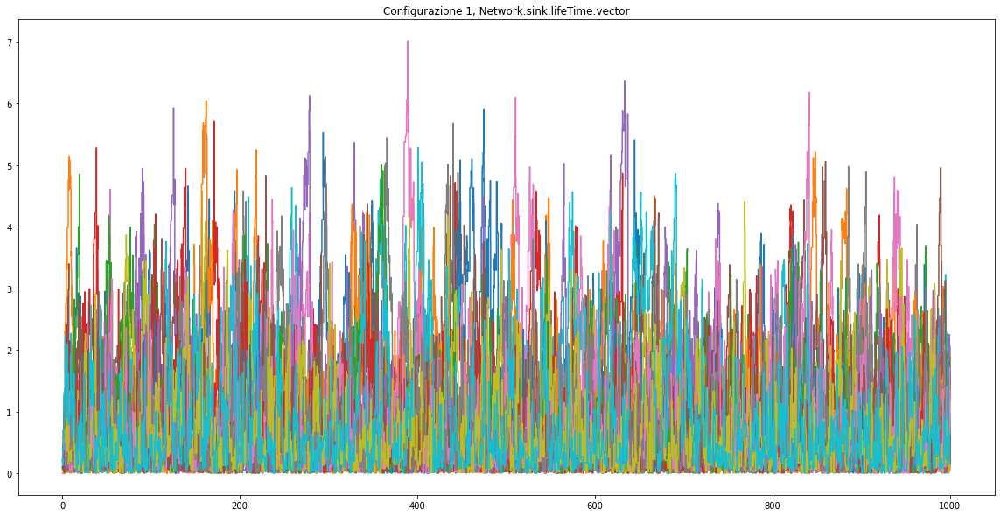

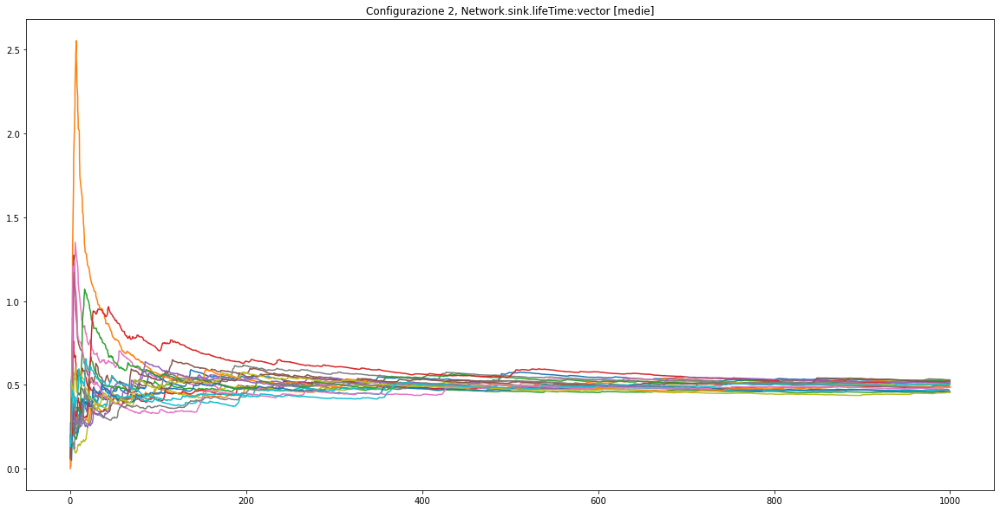

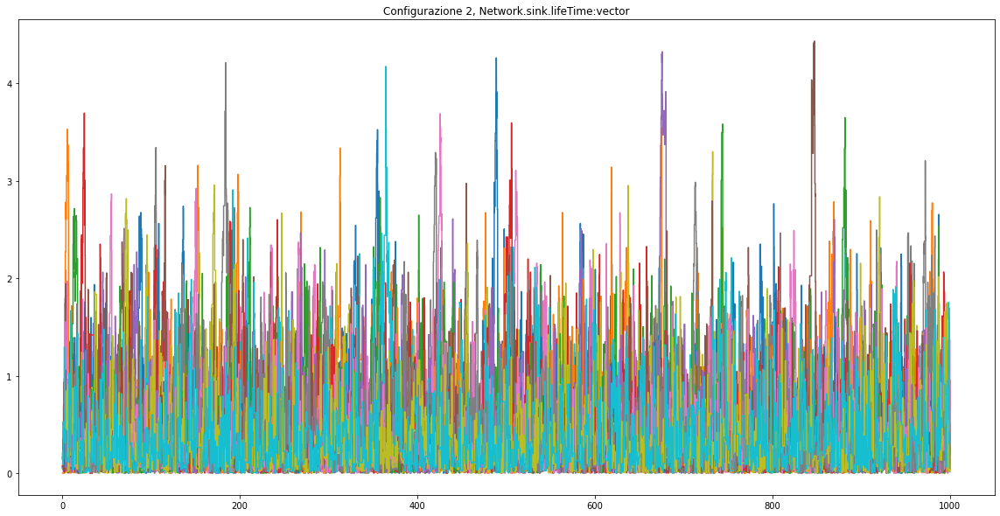

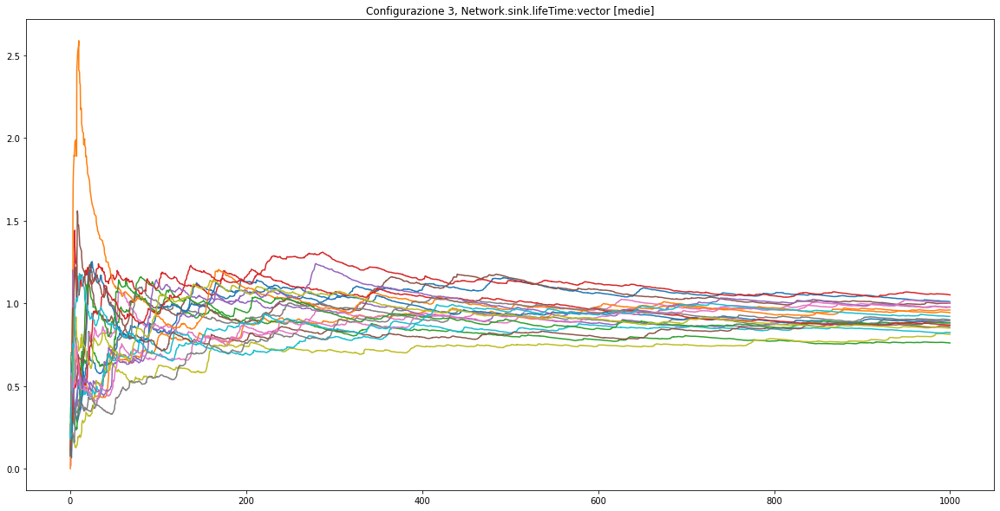

...

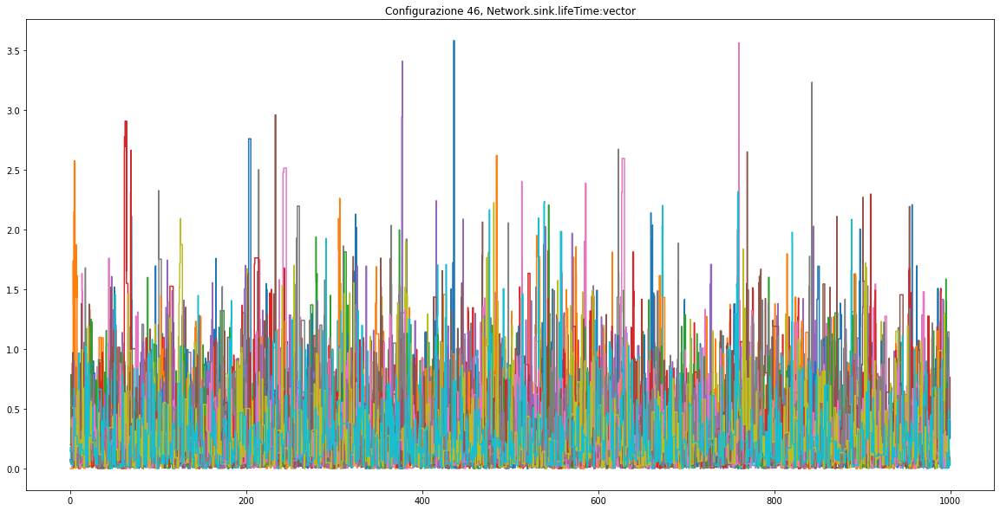

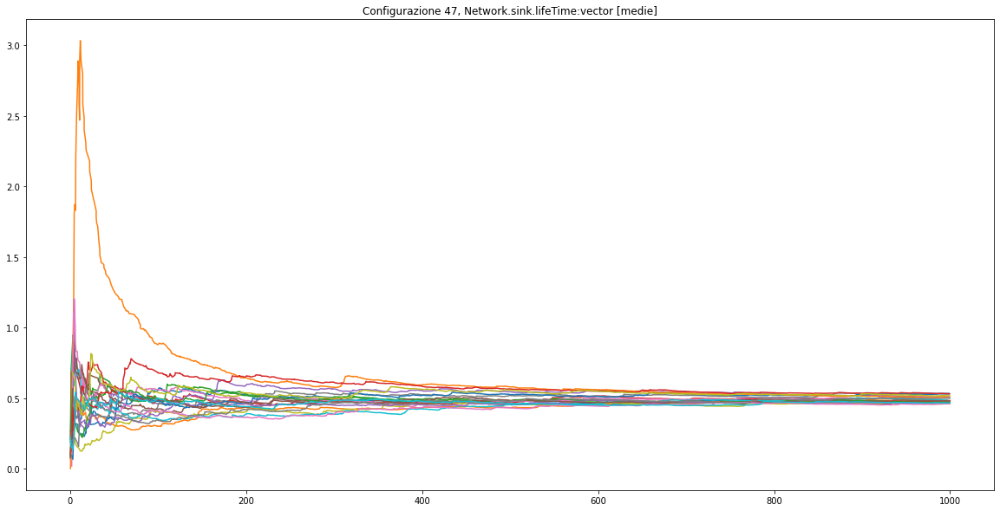

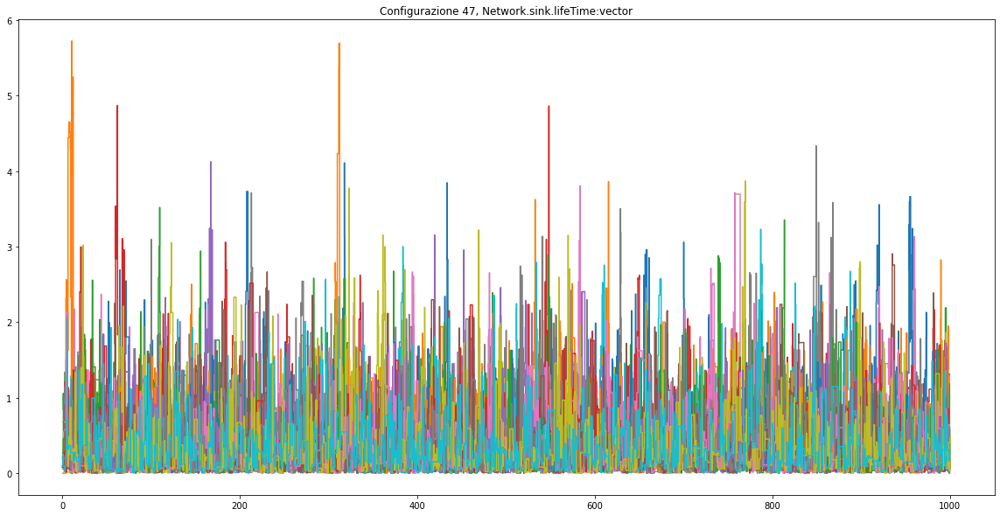

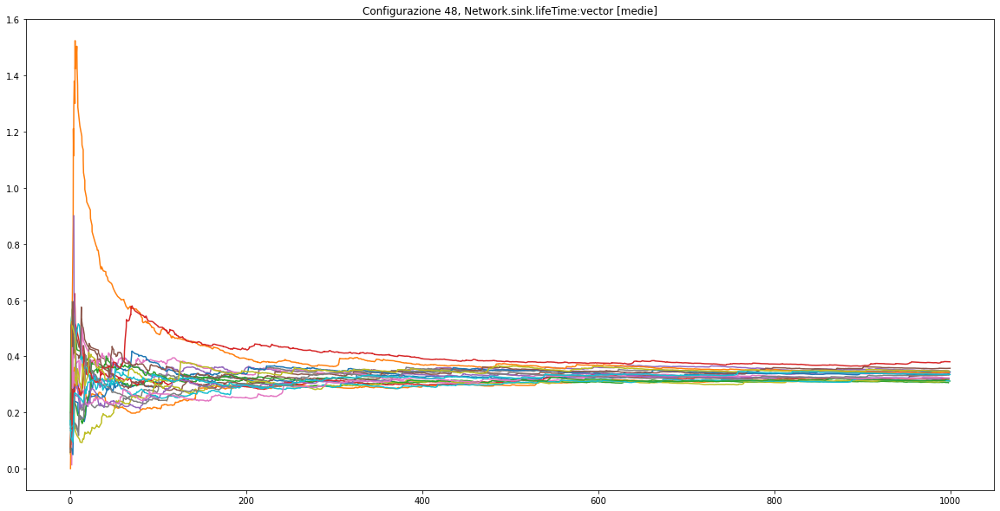

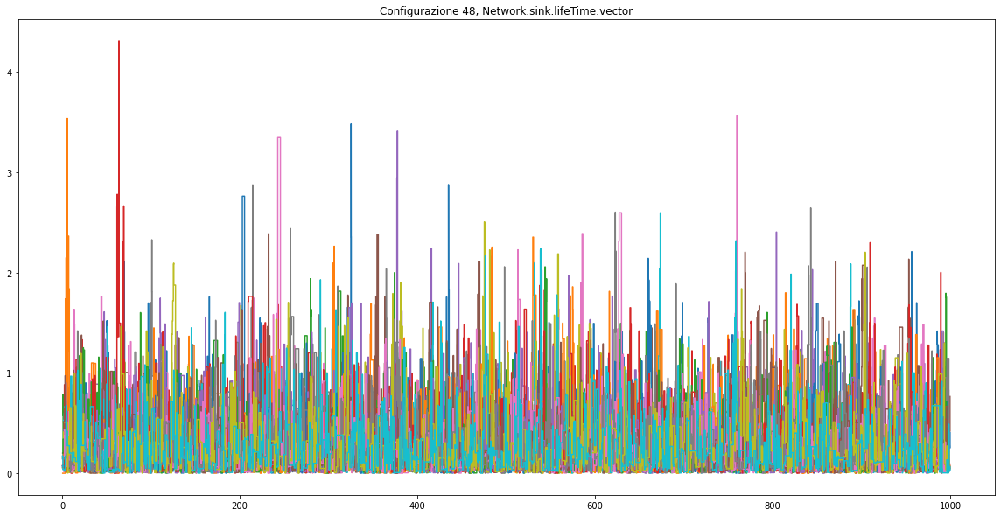

In [129]:
# Grafici per Network.sink.lifeTime:vector

for i in range(48):
    n = pd.read_csv('csvresults/n{}.csv'.format(i + 1), converters = {'vectime': parse_ndarray, 'vecvalue': parse_ndarray})

    vectors = n[(n['module'] == 'Network.sink') & (n['name'] == 'lifeTime:vector') & (n['type'] == 'vector')]
    for v in vectors.itertuples():
        plt.plot(v.vectime, running_avg(v.vecvalue))
    plt.title('Configurazione {}, Network.sink.lifeTime:vector [medie]'.format(i + 1))
    plt.show()
    for v in vectors.itertuples():
        plt.plot(v.vectime, v.vecvalue, drawstyle='steps-post')
    plt.title('Configurazione {}, Network.sink.lifeTime:vector'.format(i + 1))
    plt.show()

In [167]:
# studio dei valori di Network.sink.lifeTime:vector

medianas = list()

for i in range(48):
    n = pd.read_csv('csvresults/n{}.csv'.format(i + 1))
    vectors = n[(n['module'] == 'Network.sink') & (n['name'] == 'lifeTime:vector') & (n['type'] == 'vector')]
    veclistraw = list()
    for v in vectors.itertuples():
        veclistraw.append(v)
    veclist = orderrunlist(veclistraw)
    mediana = list()
    for v in veclist:
        sortedv = sorted(v.vecvalue.split(' '))
        mediana.append(float(sortedv[int(len(sortedv) / 2)]))
    medianas.append(mediana)

medianameans = list()

for m in medianas:
    medianameans.append(statistics.mean(m))
    
print('=== medianas ===')
print(medianas)

print('\n=== medianameans ===')
print(medianameans)

=== medianas ===
[[0.779609592983, 0.682195436227, 0.623834110095, 0.671654540776, 0.696627072076, 0.66574528734, 0.740170131257, 0.647423124432, 0.658187669522, 0.691687968722, 0.705685226444, 0.605631842071, 0.883353147923, 0.695641928466, 0.744473285748, 0.752608767388, 0.711056476778, 0.576901582659, 0.665829920592, 0.676587393688], [0.369864915107, 0.326295061524, 0.330171350228, 0.369088763272, 0.357338043638, 0.351320137657, 0.337274092657, 0.335601082569, 0.318121795469, 0.344939330072, 0.362840463355, 0.360235749856, 0.335879581457, 0.363219894322, 0.337467456084, 0.358662720653, 0.367058244165, 0.344948194923, 0.323822634205, 0.321426654278], [0.711555403489, 0.631011506136, 0.576249672763, 0.619144001367, 0.625282302464, 0.595922329688, 0.68059572491, 0.61020673579, 0.602793031007, 0.600824177057, 0.638281154804, 0.56174916363, 0.759183027062, 0.607453911346, 0.663928381621, 0.671258902849, 0.648577851239, 0.548878956766, 0.575941333459, 0.608846053581], [0.34985569678, 0.31